# CV - Object Detection and Beyond
## Framework: Pytorch | Model: YOLO

In [ ]:
!pip install ultralytics torch torchvision torchaudio opencv-python matplotlib segmentation-models-pytorch albumentations -q

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import zipfile
import os
import requests
import glob as glob

import torch
import cv2
from PIL import Image
from ultralytics import YOLO

In [ ]:
def download_file(url, save_name):
    file = requests.get(url)
    open(save_name, 'wb').write(file.content)

In [ ]:
def unzip(zip_file=None):
    try:
        with zipfile.ZipFile(zip_file) as z:
            z.extractall("./")
            print("Extracted all")
    except:
        print("Invalid file")

In [ ]:
download_file(
    'https://www.dropbox.com/s/h7l1lmhvga6miyo/object_detection_images.zip?dl=1',
    'object_detection_images.zip'
)

In [ ]:
unzip(zip_file='object_detection_images.zip')

In [11]:
image_paths = sorted(glob.glob('object_detection_images' + '/*.png'))

for idx in range(len(image_paths)):
    print(image_paths[idx])

object_detection_images/dog_bicycle_car.png
object_detection_images/elephants.png
object_detection_images/home_interior.png
object_detection_images/place_setting.png
object_detection_images/scene_man_dog.png


In [12]:
def load_image(path):
    image = cv2.imread(path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

In [13]:
images = [load_image(path) for path in image_paths]

In [14]:
images[1].shape

(874, 1264, 3)

In [15]:
def display_images(images):
    num_images = len(images)
    fig, axes = plt.subplots(nrows=num_images, ncols=1, figsize=(10, num_images * 5))
    if num_images == 1:
        axes = [axes] 
    for i, axis in enumerate(axes):
        axis.imshow(images[i])
        axis.axis('off')
    plt.tight_layout()
    plt.show()

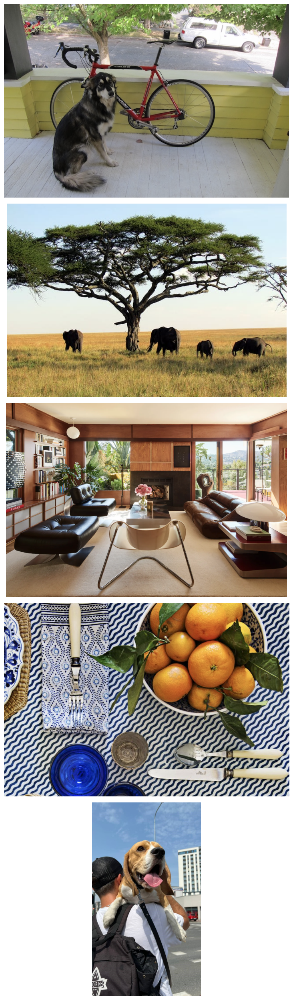

In [7]:
display_images(images)

## 1. Object Detection using YOLO

In [8]:
model_od = YOLO('yolov8m.pt')

100%|███████████████████████████████████████| 49.7M/49.7M [01:20<00:00, 651kB/s]


In [11]:
results = [model_od(img)[0].plot() for img in images]


0: 448x640 1 bicycle, 1 truck, 1 dog, 26.9ms
Speed: 11.9ms preprocess, 26.9ms inference, 0.8ms postprocess per image at shape (1, 3, 448, 640)

0: 448x640 4 elephants, 26.9ms
Speed: 1.8ms preprocess, 26.9ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

0: 448x640 3 couchs, 1 potted plant, 3 books, 1 vase, 26.9ms
Speed: 1.6ms preprocess, 26.9ms inference, 0.9ms postprocess per image at shape (1, 3, 448, 640)

0: 448x640 3 cups, 2 knifes, 1 spoon, 1 bowl, 1 dining table, 26.5ms
Speed: 1.5ms preprocess, 26.5ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

0: 640x384 1 person, 1 car, 1 dog, 2 backpacks, 25.2ms
Speed: 1.2ms preprocess, 25.2ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 384)


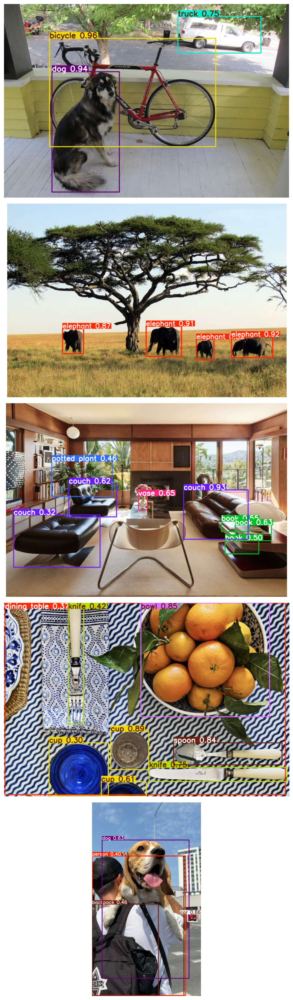

In [12]:
display_images(results)

# 2. Instance Segmentation

In [13]:
model_seg = YOLO('yolov8l-seg.pt')

In [14]:
results_seg = [model_seg(img)[0].plot() for img in images]


0: 448x640 1 bicycle, 1 truck, 1 dog, 54.2ms
Speed: 1.4ms preprocess, 54.2ms inference, 8.1ms postprocess per image at shape (1, 3, 448, 640)

0: 448x640 1 horse, 4 elephants, 51.4ms
Speed: 1.4ms preprocess, 51.4ms inference, 1.4ms postprocess per image at shape (1, 3, 448, 640)

0: 448x640 3 chairs, 1 couch, 2 potted plants, 4 books, 1 vase, 50.0ms
Speed: 1.9ms preprocess, 50.0ms inference, 1.5ms postprocess per image at shape (1, 3, 448, 640)

0: 448x640 2 cups, 1 fork, 2 knifes, 1 spoon, 1 bowl, 1 dining table, 49.6ms
Speed: 1.7ms preprocess, 49.6ms inference, 1.4ms postprocess per image at shape (1, 3, 448, 640)

0: 640x384 1 person, 1 car, 1 dog, 2 backpacks, 45.5ms
Speed: 1.4ms preprocess, 45.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 384)


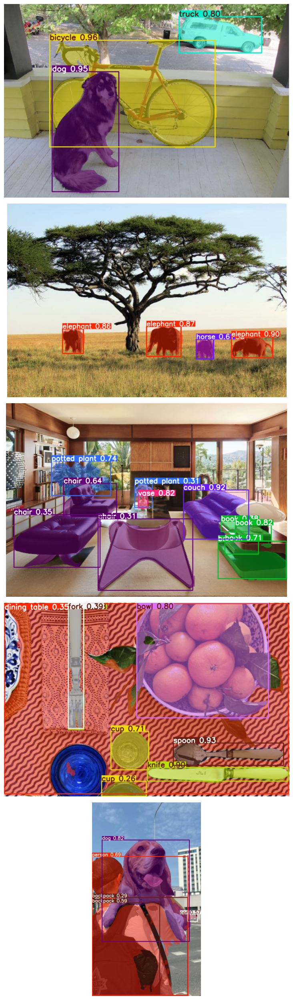

In [15]:
display_images(results_seg)

# 3. Understanding results

In [16]:
results = model_od(images)


0: 640x640 1 bicycle, 1 truck, 1 dog, 29.7ms
1: 640x640 4 elephants, 29.7ms
2: 640x640 3 couchs, 1 potted plant, 3 books, 1 vase, 29.7ms
3: 640x640 2 cups, 2 knifes, 1 spoon, 1 bowl, 1 dining table, 29.7ms
4: 640x640 1 person, 1 car, 1 dog, 2 backpacks, 29.7ms
Speed: 2.6ms preprocess, 29.7ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


In [17]:
type(results[0])

ultralytics.engine.results.Results

In [19]:
results[4].boxes

ultralytics.engine.results.Boxes object with attributes:

cls: tensor([ 2., 16., 24.,  0., 24.], device='cuda:0')
conf: tensor([0.6556, 0.6317, 0.4707, 0.3994, 0.3407], device='cuda:0')
data: tensor([[6.3136e+02, 7.3898e+02, 6.9539e+02, 7.8783e+02, 6.5559e-01, 2.0000e+00],
        [6.6805e+01, 2.4816e+02, 6.4179e+02, 1.1320e+03, 6.3167e-01, 1.6000e+01],
        [6.3434e-01, 6.7753e+02, 4.3707e+02, 1.2788e+03, 4.7067e-01, 2.4000e+01],
        [5.2078e-01, 3.5324e+02, 6.1994e+02, 1.2763e+03, 3.9938e-01, 0.0000e+00],
        [5.8990e+01, 2.5540e+02, 6.3277e+02, 1.2718e+03, 3.4065e-01, 2.4000e+01]], device='cuda:0')
id: None
is_track: False
orig_shape: (1280, 720)
shape: torch.Size([5, 6])
xywh: tensor([[ 663.3785,  763.4083,   64.0278,   48.8521],
        [ 354.2961,  690.0775,  574.9816,  883.8450],
        [ 218.8532,  978.1643,  436.4377,  601.2607],
        [ 310.2321,  814.7472,  619.4226,  923.0215],
        [ 345.8806,  763.5881,  573.7816, 1016.3784]], device='cuda:0')
xywhn: tens

In [29]:
result = model_seg(images)


0: 640x640 1 bicycle, 1 truck, 1 dog, 64.2ms
1: 640x640 1 horse, 4 elephants, 64.2ms
2: 640x640 3 chairs, 1 couch, 2 potted plants, 4 books, 1 vase, 64.2ms
3: 640x640 2 cups, 1 fork, 2 knifes, 1 spoon, 1 bowl, 1 dining table, 64.2ms
4: 640x640 1 person, 1 car, 1 dog, 2 backpacks, 64.2ms
Speed: 3.2ms preprocess, 64.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


In [52]:
results[4]

ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: None
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl', 46: 'banana', 47: 'apple', 48: 'sandwich', 49: 'orange', 50: 'broccoli', 51: 'carrot', 52: 'hot dog', 53: 'pizza', 54: 'donut', 55: 'cake', 56: 'chair', 57: 'couch', 58: 'potted plant',

In [ ]:
# maybe show one mask?

# for r in result:
#     print(r.masks)

# 4. Inference Arguments

In [42]:
model_seg = YOLO('yolov8l-seg.pt')

In [46]:
result = model_seg(images[4], 
                   conf=0.3,
                   # iou=0.7,
                   max_det=10,
                   classes=[0]
                  )


0: 640x384 1 person, 50.4ms
Speed: 12.6ms preprocess, 50.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 384)


In [47]:
result[0].boxes

ultralytics.engine.results.Boxes object with attributes:

cls: tensor([0.], device='cuda:0')
conf: tensor([0.6923], device='cuda:0')
data: tensor([[2.6276e-01, 3.5763e+02, 6.3418e+02, 1.2758e+03, 6.9226e-01, 0.0000e+00]], device='cuda:0')
id: None
is_track: False
orig_shape: (1280, 720)
shape: torch.Size([1, 6])
xywh: tensor([[317.2215, 816.7130, 633.9174, 918.1644]], device='cuda:0')
xywhn: tensor([[0.4406, 0.6381, 0.8804, 0.7173]], device='cuda:0')
xyxy: tensor([[2.6276e-01, 3.5763e+02, 6.3418e+02, 1.2758e+03]], device='cuda:0')
xyxyn: tensor([[3.6494e-04, 2.7940e-01, 8.8081e-01, 9.9672e-01]], device='cuda:0')

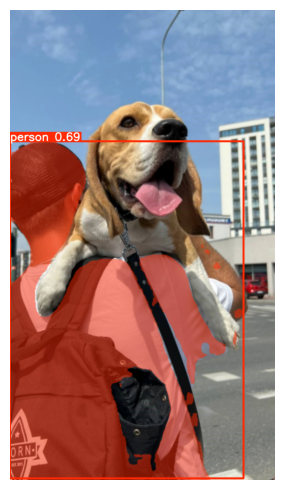

In [48]:
results = []
results.append(result[0].plot())
display_images(results)

# 5. Detection Use Cases

## 5.1 Object Counting

In [49]:
model_od = YOLO('yolov8m.pt')

In [50]:
results = [model_od(img, conf=0.3)[0] for img in images]


0: 448x640 1 bicycle, 1 truck, 1 dog, 25.6ms
Speed: 1.5ms preprocess, 25.6ms inference, 0.8ms postprocess per image at shape (1, 3, 448, 640)

0: 448x640 4 elephants, 26.4ms
Speed: 1.6ms preprocess, 26.4ms inference, 0.9ms postprocess per image at shape (1, 3, 448, 640)

0: 448x640 3 couchs, 1 potted plant, 3 books, 1 vase, 24.2ms
Speed: 1.5ms preprocess, 24.2ms inference, 1.1ms postprocess per image at shape (1, 3, 448, 640)

0: 448x640 2 cups, 2 knifes, 1 spoon, 1 bowl, 1 dining table, 24.2ms
Speed: 1.6ms preprocess, 24.2ms inference, 0.9ms postprocess per image at shape (1, 3, 448, 640)

0: 640x384 1 person, 1 car, 1 dog, 2 backpacks, 24.5ms
Speed: 1.3ms preprocess, 24.5ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 384)


In [53]:
object_counts_list = []
for result in results:    
    class_ids = result.boxes.cls.cpu().numpy().astype(int)
    unique, counts = np.unique(class_ids, return_counts=True)
    object_counts = {result.names[i]: count for i, count in zip(unique, counts)}
    object_counts_list.append(object_counts)

In [54]:
for idx, obj_count in enumerate(object_counts_list):
    print(f"Image {idx + 1}: {obj_count}")

Image 1: {'bicycle': np.int64(1), 'truck': np.int64(1), 'dog': np.int64(1)}
Image 2: {'elephant': np.int64(4)}
Image 3: {'couch': np.int64(3), 'potted plant': np.int64(1), 'book': np.int64(3), 'vase': np.int64(1)}
Image 4: {'cup': np.int64(2), 'knife': np.int64(2), 'spoon': np.int64(1), 'bowl': np.int64(1), 'dining table': np.int64(1)}
Image 5: {'person': np.int64(1), 'car': np.int64(1), 'dog': np.int64(1), 'backpack': np.int64(2)}


## 5.2 Object Tracking

In [2]:
import cv2
from ultralytics import YOLO
from ultralytics import solutions

In [18]:
model_v = YOLO("yolo11l.pt")

100%|██████████████████████████████████████| 49.0M/49.0M [00:45<00:00, 1.14MB/s]


In [19]:
src = 'vids/dha_c.mp4'

In [5]:
# results = model_v.track(src, persist=True, 
#                                 verbose=False,
#                                 # stream=True,
#                                 classes=[0], 
#                                 vid_stride=10,
#                                 show=True
#                                )

In [20]:
cap = cv2.VideoCapture(src)

width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
new_height = 1080
ratio = new_height / height
new_width = int(width * ratio)

while cap.isOpened():
    success, frame = cap.read()
    if success:
        r_frame = cv2.resize(frame, (new_width, new_height))
        results = model_v.track(r_frame, 
                                persist=True, 
                                verbose=False,
                                # stream=True,
                                # classes=[0], 
                                # vid_stride=2
                               )
        a_frame = results[0].plot()
        # r_frame = cv2.resize(a_frame, (new_width, new_height) )
        cv2.imshow("YOLO11 Tracking", a_frame)
        if cv2.waitKey(1) & 0xFF == ord("q"):
            break
    else:
        break

cap.release()
cv2.destroyAllWindows()

## 5.3 Heat Map

In [7]:
heatmap = solutions.Heatmap(model="yolo11m.pt", 
                            colormap=cv2.COLORMAP_JET,
                            verbose=False
                           )

Ultralytics Solutions: ✅ {'region': None, 'show_in': True, 'show_out': True, 'colormap': 2, 'up_angle': 145.0, 'down_angle': 90, 'kpts': [6, 8, 10], 'analytics_type': 'line', 'json_file': None, 'records': 5, 'model': 'yolo11m.pt', 'verbose': False}


In [9]:
cap = cv2.VideoCapture(src)

width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
new_height = 720
ratio = new_height / height
new_width = int(width * ratio)

while cap.isOpened():
    success, frame = cap.read()
    if success:
        frame_resized = cv2.resize(frame, (new_width, new_height))
        heatmap_frame = heatmap.generate_heatmap(frame_resized)
        cv2.imshow("YOLOv11 Heatmap", heatmap_frame)
        if cv2.waitKey(1) & 0xFF == ord("q"):
            break
    else:
        break

cap.release()
cv2.destroyAllWindows()


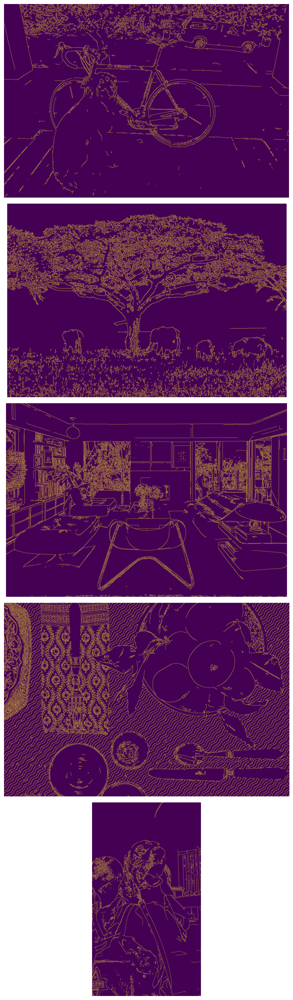

In [16]:
edges = [cv2.Canny(cv2.cvtColor(img, cv2.COLOR_RGB2GRAY), 100, 200) for img in images]
display_images(edges)